## Technology Focus - 10x Genomics Xenium

### Read data

In [1]:
from pathlib import Path

data_path = Path("/g/huber/projects/GSK_lazic/GSK_data_confidential/lung_copd/ELN357546/output-XETG00134__Xenium_089__COPD410__20241024__113632_sample")

#data_path = Path("/g/huber/projects/CODEX/segtraq/valid_testdata/BC_cellseg_10x/BC_Xenium_cellseg_largesample")

#### Read 10x Xenium segmentation

In [2]:
import segtraq as st
import spatialdata as sd

#sdata_xenium = st.io.read_xenium(data_path)

sdata_xenium = sd.read_zarr(data_path / "10x_xenium_sdata.zarr")

st.io.validate_spatialdata(sdata_xenium, data_key="scale0/image")

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


True

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


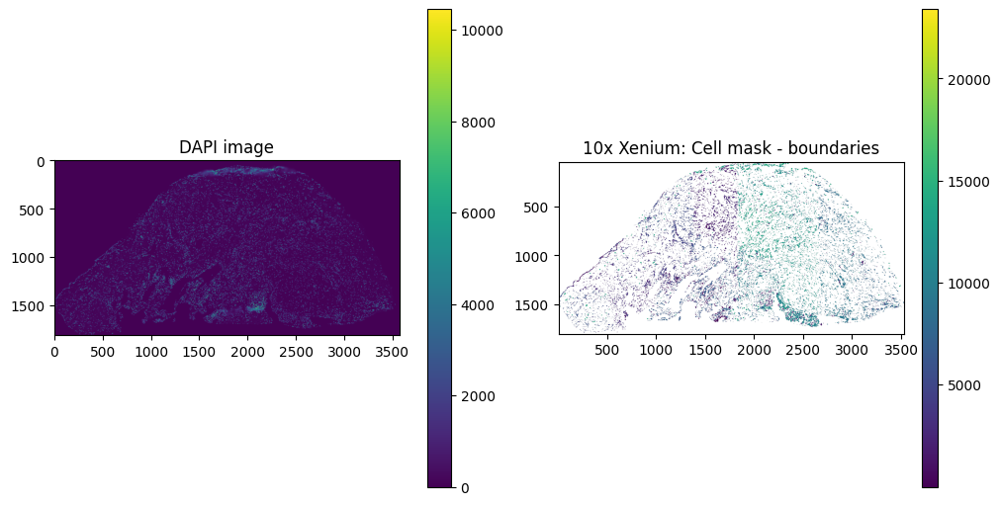

In [3]:
import spatialdata_plot
import matplotlib.pyplot as plt

axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

#Dapi image
sdata_xenium.pl.render_images("morphology_focus").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_xenium.tables["table"].obs["region"] = "cell_boundaries"
sdata_xenium.set_table_annotates_spatialelement("table", region="cell_boundaries")

sdata_xenium.pl.render_shapes("cell_boundaries", color="label_id").pl.show(
    ax=axes[1], title="10x Xenium: Cell mask - boundaries", coordinate_systems="global"
)

In [4]:
bb_xmin = 2000
bb_ymin = 1100
bb_w = 500
bb_h = 720
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


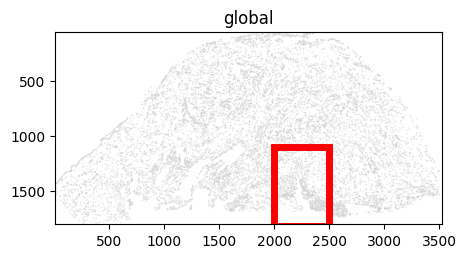

In [5]:
import matplotlib.patches as patches

f, ax = plt.subplots(figsize=(5,5))
sdata_xenium.pl.render_shapes("cell_boundaries").pl.show(ax=ax)
rect = patches.Rectangle((bb_xmin, bb_ymin), bb_w, bb_h, linewidth=5, edgecolor="red", facecolor="none")
ax.add_patch(rect)

In [6]:
def crop(sdata, xmin, ymin, xmax, ymax):
    return sdata.query.bounding_box(
        axes=["x", "y"],
        min_coordinate=[xmin, ymin],
        max_coordinate=[xmax, ymax],
        target_coordinate_system="global",
    )

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key

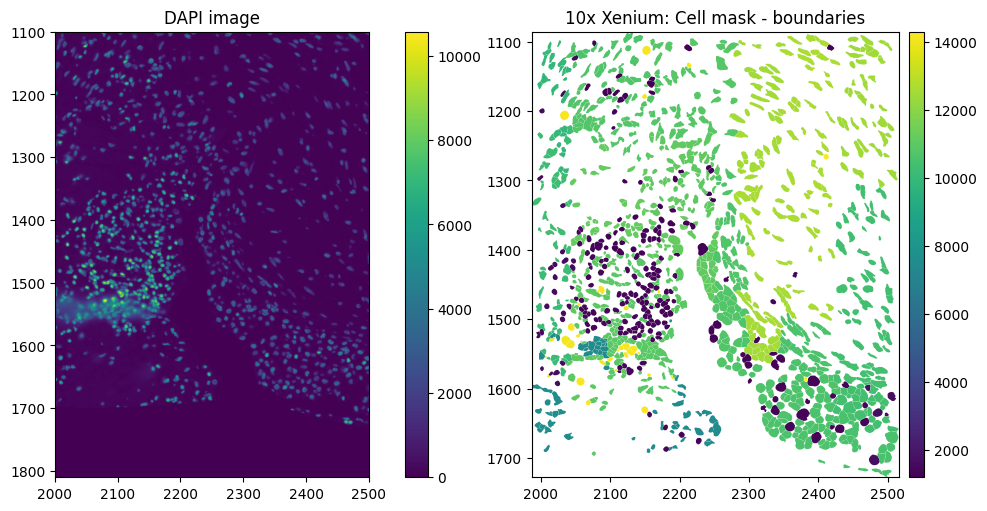

In [7]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

sdata_xenium_cropped = crop(sdata_xenium, bb_xmin, bb_ymin, bb_xmax, bb_ymax)

#Dapi image
sdata_xenium_cropped.pl.render_images("morphology_focus").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_xenium_cropped.tables["table"].obs["region"] = "cell_boundaries"
sdata_xenium_cropped.set_table_annotates_spatialelement("table", region="cell_boundaries")

sdata_xenium_cropped.pl.render_shapes("cell_boundaries", color="label_id").pl.show(
    ax=axes[1], title="10x Xenium: Cell mask - boundaries", coordinate_systems="global"
)

#### Read BIDCell segmentation

In [8]:
# sdata_bidcell = st.io.read_bidcell(data_path / "bidcell_output")
sdata_bidcell = sd.read_zarr(data_path / "bidcell_output/bidcell_sdata.zarr")

st.io.validate_spatialdata(sdata_bidcell, background_cell_id=0, data_key="scale0/image")

version mismatch: detected: RasterFormatV02, requested: FormatV04


/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


True

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key

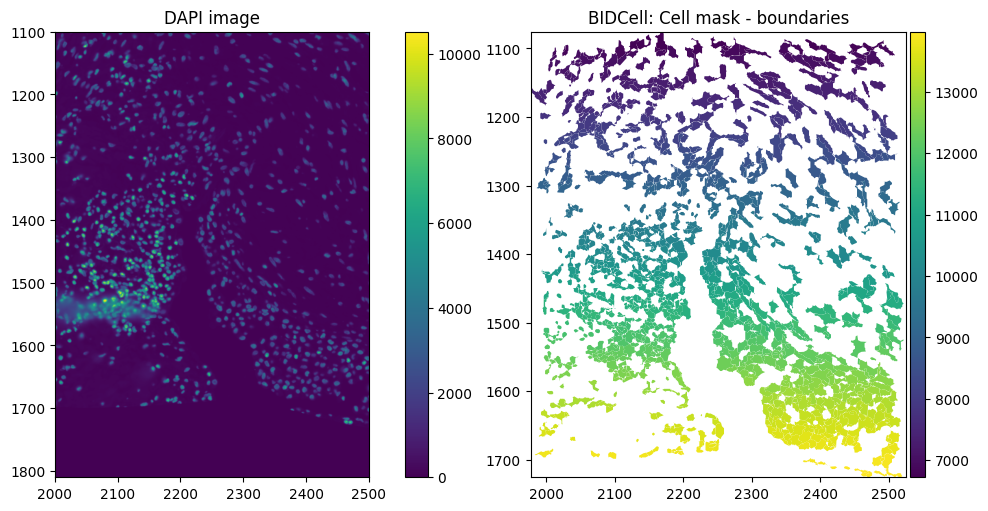

In [9]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

sdata_bidcell_cropped = crop(sdata_bidcell, bb_xmin, bb_ymin, bb_xmax, bb_ymax)

#Dapi image
sdata_bidcell_cropped.pl.render_images("morphology_focus").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_bidcell_cropped.tables["table"].obs["region"] = "cell_boundaries"
sdata_bidcell_cropped.set_table_annotates_spatialelement("table", region="cell_boundaries")

sdata_bidcell_cropped.pl.render_shapes("cell_boundaries", color="label_id").pl.show(
    ax=axes[1], title="BIDCell: Cell mask - boundaries", coordinate_systems="global"
)

#### Read Proseg segmentation

In [10]:
#sdata_proseg = st.io.read_proseg_2(data_path / "proseg_output")
sdata_proseg = sd.read_zarr(data_path / "proseg_output/proseg_sdata.zarr")

#st.io.validate_spatialdata(sdata_proseg, background_cell_id=0, shape_key="cell_boundaries_z1", label_key="cell_labels_z1", data_key="scale0/image")

version mismatch: detected: RasterFormatV02, requested: FormatV04
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:184: UserWarning: The table is annotating 'cell_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:184: UserWarning: The table is annotating 'cell_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:184: UserWarning: The table is annotating 'cell_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `cell_boundaries_z1` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


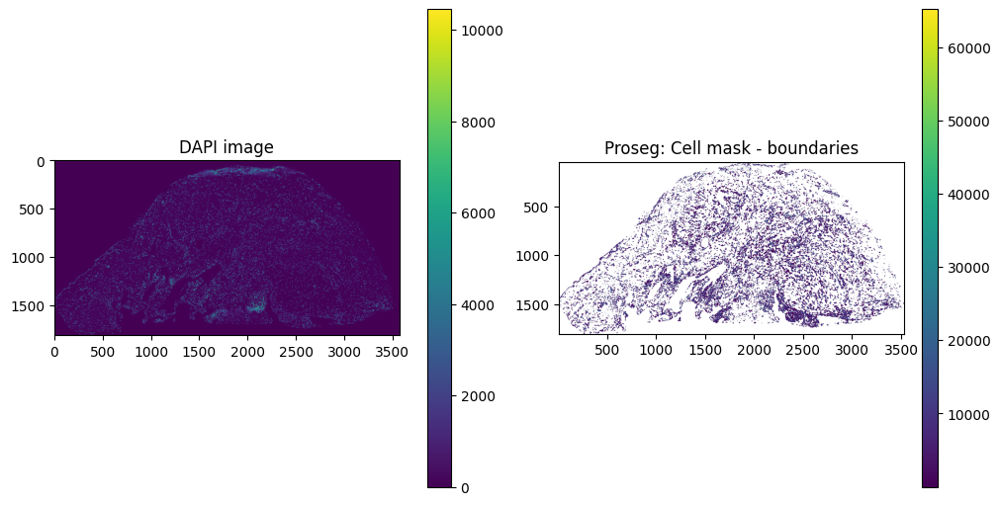

In [11]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

#Dapi image
sdata_proseg.pl.render_images("morphology_focus").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_proseg.tables["table"].obs["region"] = "cell_boundaries_z1"
sdata_proseg.set_table_annotates_spatialelement("table", region="cell_boundaries_z1")

sdata_proseg.pl.render_shapes("cell_boundaries_z1", color="label_id").pl.show(
    ax=axes[1], title="Proseg: Cell mask - boundaries", coordinate_systems="global"
)

#### Read Segger segmentation

In [12]:
#sdata_segger = st.io.read_segger(data_path / "segger_output")
sdata_segger = sd.read_zarr(data_path / "segger_output/segger_sdata.zarr")

st.io.validate_spatialdata(sdata_segger, data_key="scale0/image")

version mismatch: detected: RasterFormatV02, requested: FormatV04
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/tmp/ipykernel_1962077/989575548.py:4: UserWarning: Missing 191 cell IDs in labels.There are 13593 cell IDs in shapes, but only 13402 are in labels. This might lead to inconsistencies in the spatialdata object.
  st.io.validate_spatialdata(sdata_segger, data_key="scale0/image")


True

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:108: UserWarning: Key `cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/spatialdata/_core/_elements.py:128: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


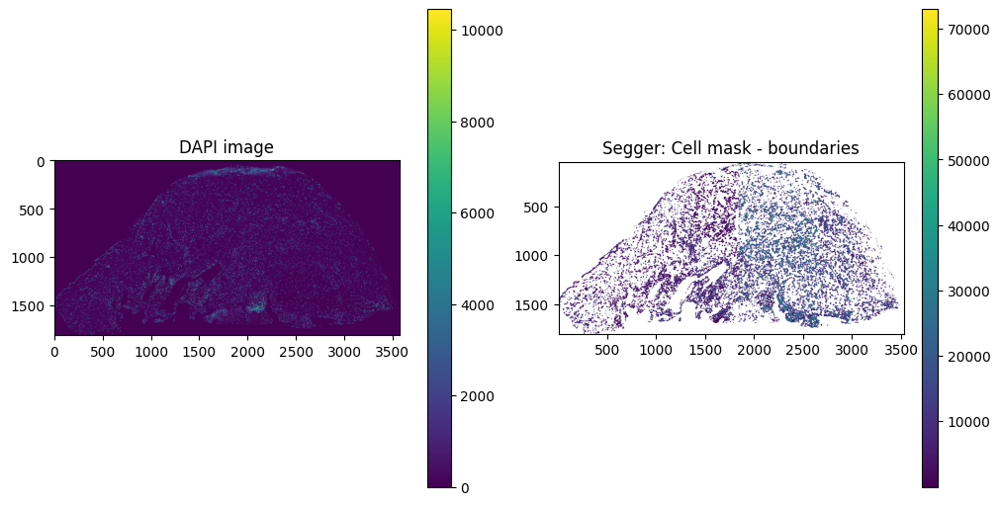

In [13]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

#Dapi image
sdata_segger.pl.render_images("morphology_focus").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell labels
sdata_segger.tables["table"].obs["region"] = "cell_boundaries"
sdata_segger.set_table_annotates_spatialelement("table", region="cell_boundaries")

sdata_segger.pl.render_shapes("cell_boundaries", color="label_id").pl.show(
    ax=axes[1], title="Segger: Cell mask - boundaries", coordinate_systems="global"
)

#### Define parameters for SegTraQ

In [14]:
sdata_dict = {
    "xenium": {
        "sdata" : sdata_xenium,
        "ua_key" : "UNASSIGNED",
        "cell_bd" : "cell_boundaries",
        "cell_lb" : "cell_labels"
    },
    "bidcell": {
        "sdata" : sdata_bidcell,
        "ua_key" : 0,
        "cell_bd" : "cell_boundaries",
        "cell_lb" : "cell_labels"
    },
    "proseg": {
        "sdata" : sdata_proseg,
        "ua_key" : 0,
        "cell_bd" : "cell_boundaries_z1",
        "cell_lb" : "cell_labels_z0"
    },
    "segger": {
        "sdata" : sdata_segger,
        "ua_key" : "UNASSIGNED",
        "cell_bd" : "cell_boundaries",
        "cell_lb" : "cell_labels"
    }
}

#### Plot transcripts colored by cell ID

In [15]:
import numpy as np
import tifffile as tiff

output_dir = data_path / "QC"

for method, v in sdata_dict.items():

    obs = v["sdata"].tables["table"].obs

    max_id = obs["label_id"].max()

    da = v["sdata"].labels[v["cell_lb"]]["scale0"]["image"]
    labels = da.to_numpy()
    H, W = labels.shape

    pts = v["sdata"].points["transcripts"]
    df = pts.compute() if hasattr(pts, "compute") else pts

    id_map = dict(zip(obs["cell_id"], obs["label_id"], strict=False))
    id_map.setdefault(v["ua_key"], 0)

    x = df["x"].astype(int).to_numpy()
    y = df["y"].astype(int).to_numpy()
    lid = df["cell_id"].map(id_map).astype(int).to_numpy()

    ok = (x >= 0) & (x < W) & (y >= 0) & (y < H) & (lid >= 0) & (lid <= max_id)

    img_id = np.zeros((H, W), np.uint32)
    img_id[y[ok], x[ok]] = lid[ok]
    tiff.imwrite(output_dir / f"transcripts_{method}.tif", img_id)

    if method == "proseg":
        z_channels = int(df["z"].max() - df["z"].min())
        img_3D = np.zeros(((z_channels + 1), H, W), dtype=np.uint32)
        z = df["z"].astype(int).to_numpy()
        z_offset = df["z"].astype(int).min()
        img_3D[z[ok] - z_offset, y[ok], x[ok]] = lid[ok]
        tiff.imwrite(output_dir / f"transcripts_{method}_3D.tif", img_3D)

    if method == "xenium":
        unique_features = df["feature_name"].unique()
        feature_map = dict(zip(unique_features, range(1, len(unique_features) + 1), strict=False))
        fid = df["feature_name"].map(feature_map).astype(int).to_numpy()

        z_channels = int(df["z"].max() - df["z"].min())
        img_3D = np.zeros(((z_channels + 1), H, W), dtype=np.uint32)
        z = df["z"].astype(int).to_numpy()
        z_offset = df["z"].astype(int).min()
        img_3D[z[ok] - z_offset, y[ok], x[ok]] = fid[ok]
        tiff.imwrite(output_dir / f"transcripts_{method}_3D.tif", img_3D)


#### Baseline metrics

In [16]:
import segtraq as st

for k, v in sdata_dict.items():
    num_cells = st.bl.num_cells(v["sdata"])
    p_unassigned = st.bl.perc_unassigned_transcripts(v["sdata"], unassigned_key = v["ua_key"])
    print(f"{k}: #cells: {num_cells} %unassigned: {p_unassigned}")

xenium: #cells: 14315 %unassigned: 0.29440990712601905
bidcell: #cells: 14100 %unassigned: 0.2732437308922163
proseg: #cells: 14490 %unassigned: 0.05551079518533718
segger: #cells: 13593 %unassigned: 0.41662017952778296


In [17]:
for k, v in sdata_dict.items():
    feat = st.bl.morphological_features(v["sdata"], shape_key = v["cell_bd"], n_jobs=8)
    if "cell_area" in v["sdata"]["table"].obs.columns:
        v["sdata"]["table"].obs = v["sdata"]["table"].obs.drop(columns=["cell_area"])
    v["sdata"]["table"].obs = v["sdata"]["table"].obs.merge(
          feat,
          how = "left",
          left_on = "cell_id",
          right_on = "cell_id"
    )

/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:283: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = geom.area
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:299: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  perimeters = geom.length
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:328: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  convex_areas = convex_hull.area
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:333: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()'

In [18]:
sdata_proseg["table"].obs["cell_area"] = sdata_proseg["table"].obs["volume"]

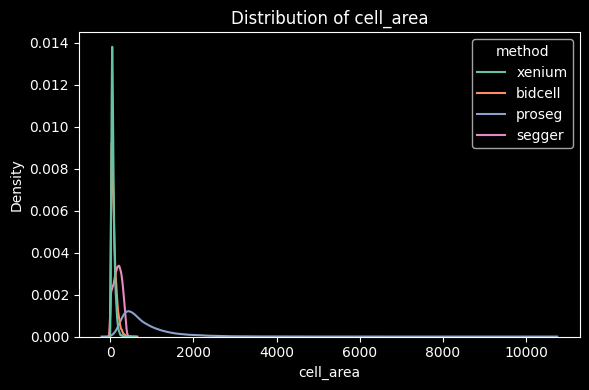

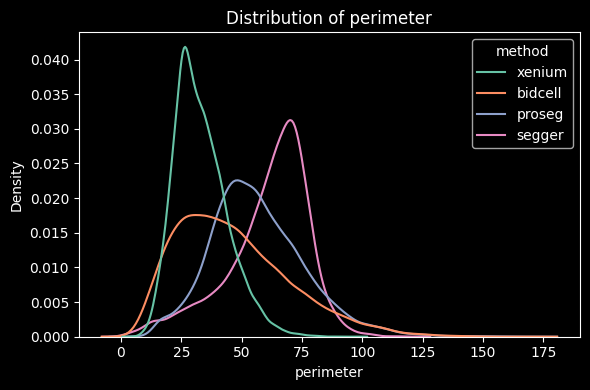

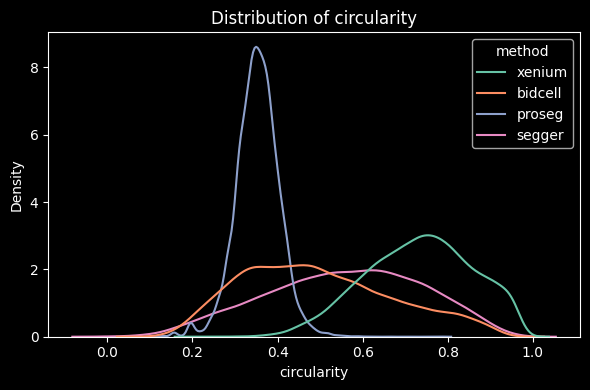

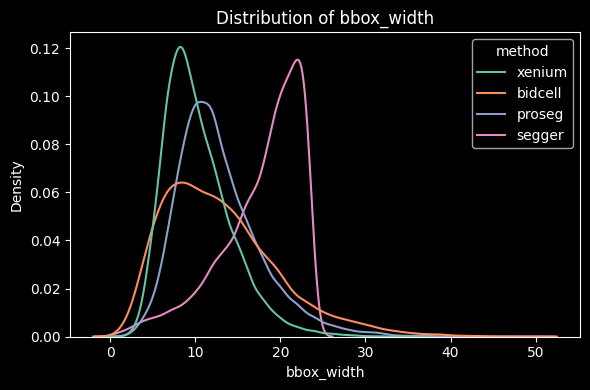

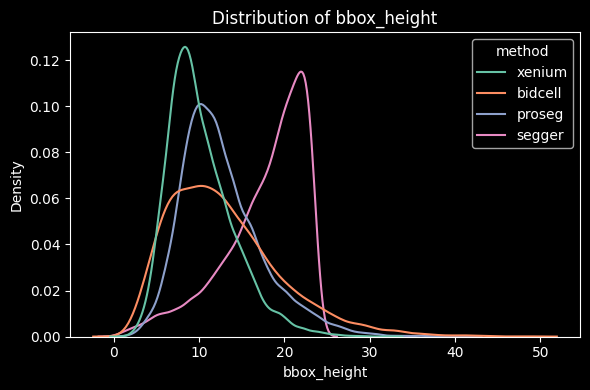

...

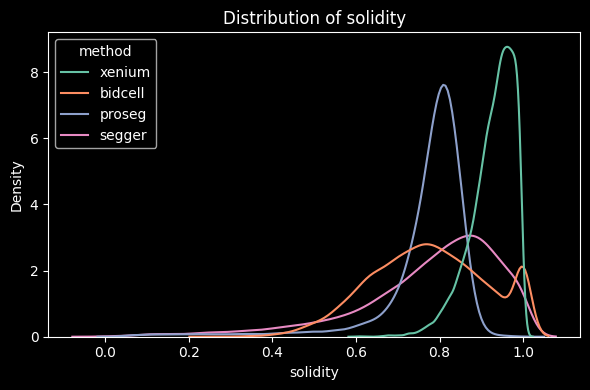

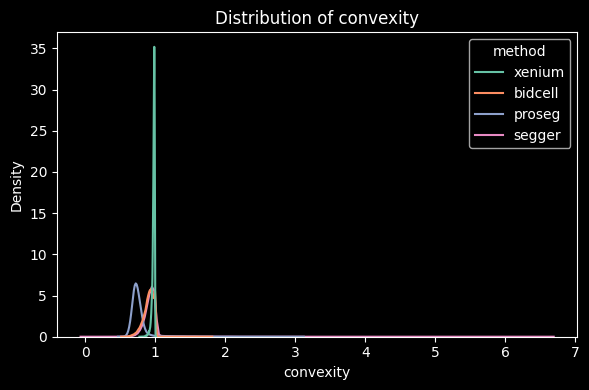

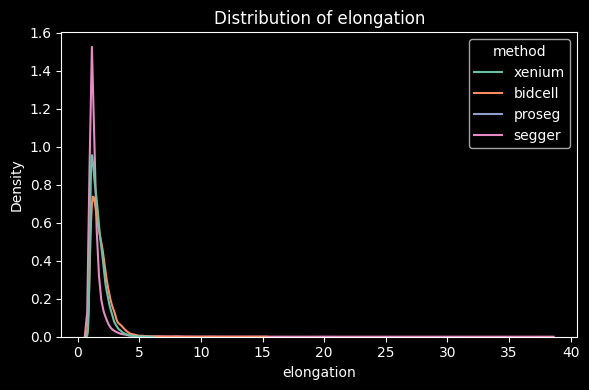

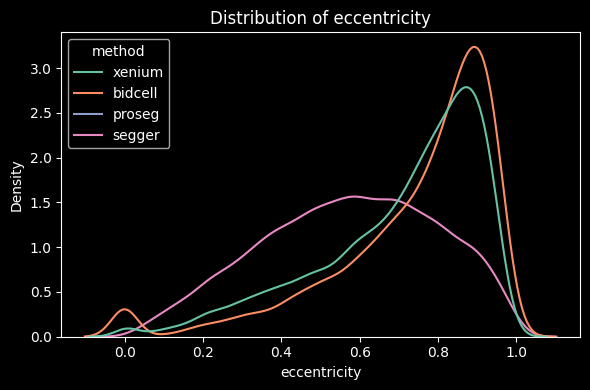

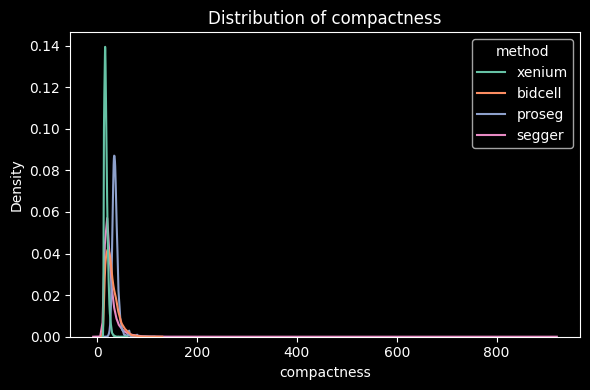

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('dark_background')

features = [
    "cell_area",
    "perimeter",
    "circularity",
    "bbox_width",
    "bbox_height",
    "extent",
    "solidity",
    "convexity",
    "elongation",
    "eccentricity",
    "compactness",
]

# Collect features into one dataframe
all_feats = []
for method, v in sdata_dict.items():
    feat = v["sdata"]["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Apply dark background globally
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
    ax.set_facecolor("black")
    
    sns.kdeplot(
        data=df,
        x=feat_name,
        hue="method",
        palette="Set2",
        common_norm=False,
        fill=False,
        ax=ax
    )
    
    # White text for readability
    ax.set_title(f"Distribution of {feat_name}")
    ax.set_xlabel(feat_name)
    ax.set_ylabel("Density")
    
    fig.tight_layout()
    #fig.savefig(f"{output_dir}/{feat_name}.png", bbox_inches="tight", dpi=300)
    #plt.close()
    plt.show()


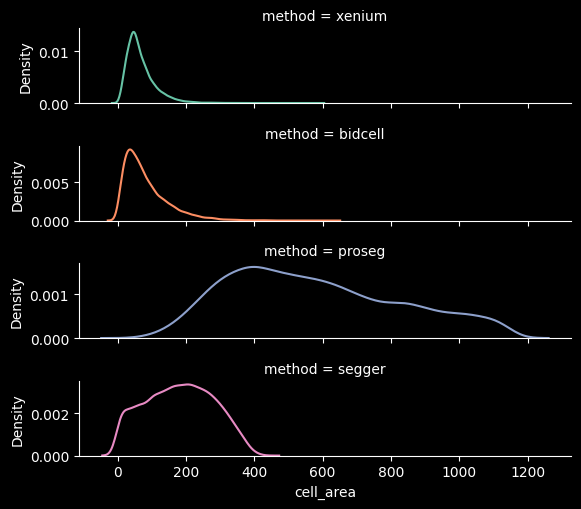

In [20]:
methods = df["method"].unique()
palette = dict(zip(methods, sns.color_palette("Set2", len(methods))))

g = sns.displot(
    data=df[df["cell_area"] <= df["cell_area"].quantile(0.95)],
    x="cell_area",
    hue="method",
    row="method",              # <-- stack vertically
    kind="kde",
    common_norm=False,
    fill=False,
    facet_kws={"sharey": False},
    palette=palette,
    height=1.3, aspect=4.6       # tweak sizing
)
g._legend.remove()             # legend redundant with facet titles

#g.savefig(f"{output_dir}/cell_area_volume.png", dpi=300, bbox_inches="tight")    



#### Clustering stability metrics

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


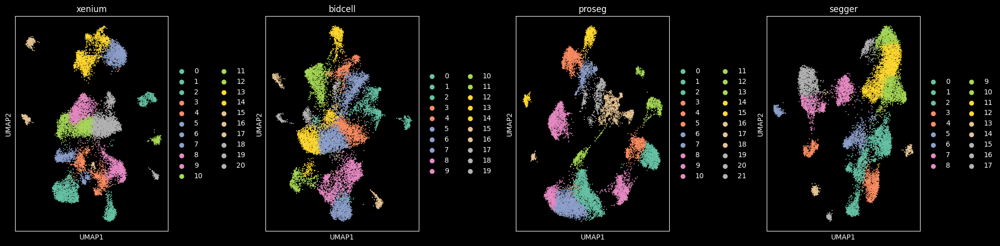

In [21]:
import copy
import scanpy as sc

fig, axs = plt.subplots(1, 4, figsize=(20,5))

# Flatten axs in case of single row/column
axs = axs.flatten()

for i, (method, v) in enumerate(sdata_dict.items()):

    # here, we do not want to alter the original data, so we create a deep copy
    adata = copy.deepcopy(v["sdata"].tables["table"])
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

    sc.pl.umap(
        adata,
        color="leiden",
        palette = "Set2",
        ax=axs[i],
        show=False,
        title=method,
    )

plt.tight_layout()
#plt.savefig(f"{output_dir}/umaps.png", bbox_inches="tight", dpi=300)
#plt.close()
plt.show()

In [22]:
import scanpy as sc

mcds = {}
silhouette_scores = {}
purities = {}
aris = {}

for method, v in sdata_dict.items():
    adata = v["sdata"].tables["table"]
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)

    mcds[method] = st.cs.compute_mean_cosine_distance(v["sdata"])
    silhouette_scores[method] = st.cs.compute_silhouette_score(v["sdata"])
    purities[method] = st.cs.compute_purity(v["sdata"])
    aris[method] = st.cs.compute_ari(v["sdata"])

/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/lazic/miniforge3/envs/segtraq/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str ind

In [23]:
results_df = pd.DataFrame(
    {
        "Method": list(mcds.keys()),
        "MCD": list(mcds.values()),
        "Silhouette Score": list(silhouette_scores.values()),
        "Purity": list(purities.values()),
        "ARI": list(aris.values()),
    }
)

In [95]:
# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="MCD",
    y="Silhouette Score",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",    # consistent method palette
    ax=ax
)

ax.set_xlabel("MCD (↓)", color="white")
ax.set_ylabel("Silhouette Score (↑)", color="white")
ax.set_title("MCD vs. Silhouette Score", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
fig.savefig(f"{output_dir}/mcd_sil.png", bbox_inches="tight", dpi=300)
plt.close()
plt.show()


In [96]:
# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(6,4), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="Purity",
    y="ARI",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",   # consistent palette
    ax=ax
)

ax.set_xlabel("Purity (↑)", color="white")
ax.set_ylabel("ARI (↑)", color="white")
ax.set_title("Purity vs. ARI", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
fig.savefig(f"{output_dir}/purity_ari.png", bbox_inches="tight", dpi=300)
plt.close()
plt.show()


#### IoU metrics

In [26]:
for method, v in sdata_dict.items():
    ious = st.nc.compute_cell_nuc_ious(v["sdata"], cell_shape_key=v["cell_bd"], n_jobs=8)

    v["sdata"]["table"].obs = v["sdata"]["table"].obs.merge(
        ious,
        how="left",
        left_on="cell_id",
        right_on="cell_id"
    )

    corr = st.nc.compute_cell_nuc_correlation(v["sdata"], cell_shape_key=v["cell_bd"])
    corr = corr.set_index("cell_id").rename(
        columns={
            "correlation": "corr_nc_cell",
    })

    corr_parts = st.nc.compute_correlation_between_parts(v["sdata"], cell_shape_key=v["cell_bd"], n_jobs=8)
    corr_parts = corr_parts.set_index("cell_id").rename(
        columns={
            "correlation_parts": "corr_cell_parts",
    })

    to_join = (
        corr.loc[:, ["corr_nc_cell"]]
        .join(corr_parts.loc[:, ["corr_cell_parts"]], how="outer")
        .reset_index()
    )

    v["sdata"]["table"].obs = v["sdata"]["table"].obs.merge(
        to_join,
        how="left",
        left_on="cell_id",
        right_on="cell_id"
    )


Processing IoU between cells and nuclei: 100%|██████████| 13593/13593 [00:10<00:00, 1247.92it/s]


In [118]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

features = [
    "IoU",
    "corr_nc_cell",
    "corr_cell_parts"
]

# Collect features into one dataframe
all_feats = []

for method, v in sdata_dict.items():
    feat = v["sdata"]["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Dark style once
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(8, 4), facecolor="black")
    ax.set_facecolor("black")
    
    sns.kdeplot(
        data=df,
        x=feat_name,
        hue="method",
        common_norm=False,
        palette="Set2",
        fill=False,
        ax=ax
    )
    
    ax.set_title(f"Distribution of {feat_name}", color="white")
    ax.set_xlabel(feat_name, color="white")
    ax.set_ylabel("Density", color="white")
    ax.tick_params(colors="white")
    
    fig.tight_layout()
    fig.savefig(f"{output_dir}/{feat_name}.png", bbox_inches="tight", dpi=300)
    plt.close()
    plt.show()


In [28]:
import copy
import matplotlib.pyplot as plt
import spatialdata_plot

def plot_ious(sdata, boundary_key):
    sdata_plot = copy.deepcopy(sdata)
    sdata_plot["table"] = sdata_plot["table"][sdata_plot["table"].obs["IoU"].notna()]

    fig, axes = plt.subplots(3, 1, figsize=(10, 30), constrained_layout=True, facecolor="black")
    axes = axes.flatten()

    # make each subplot black
    for ax in axes:
        ax.set_facecolor("black")
        ax.tick_params(colors="white")
        ax.title.set_color("white")

    # link annotations with cell boundaries
    sdata_plot.tables["table"].obs["region"] = boundary_key
    sdata_plot.set_table_annotates_spatialelement("table", region=boundary_key)

    # plot nucleus boundaries
    sdata_plot.pl.render_shapes("nucleus_boundaries").pl.show(
        ax=axes[0],
        title="Nucleus boundaries",
        coordinate_systems="global"
    )

    # plot cell boundaries colored by IoU
    sdata_plot.pl.render_shapes(boundary_key, color="IoU").pl.show(
        ax=axes[1],
        title="Cell boundaries colored by IoU",
        coordinate_systems="global"
    )

    # overlay nuclei + cells
    sdata_plot.pl.render_shapes(
        element=boundary_key,
        color="IoU",
        cmap="viridis",
        fill_alpha=1,
        outline_alpha=0.5,
        outline_width=0.5,
        outline_color="white",  # also white outlines
    ).pl.render_shapes(
        element="nucleus_boundaries",
        fill_alpha=0.1,
        outline_alpha=0.9,
        outline_width=0.5,
        outline_color="black",  # use white outlines so they show on black
    ).pl.show(
        ax=axes[2],
        title="Overlay of nuclei and cell masks colored by IoU",
        colorbar=True
    )

    return fig, axes

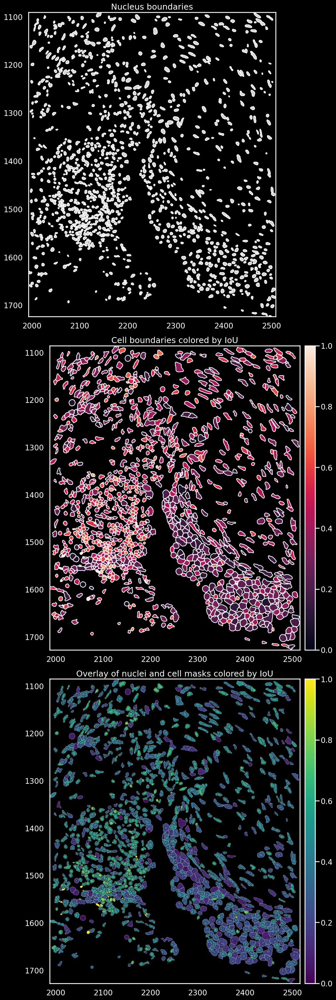

In [110]:
fig, axes = plot_ious(sdata_xenium_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/iou_xenium_cropped.png", bbox_inches="tight", dpi=300)

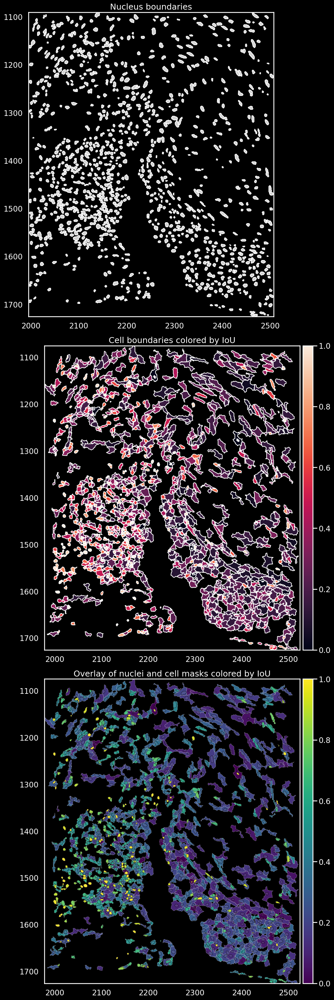

In [111]:
fig, axes = plot_ious(sdata_bidcell_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/iou_bidcell_cropped.png", bbox_inches="tight", dpi=300)

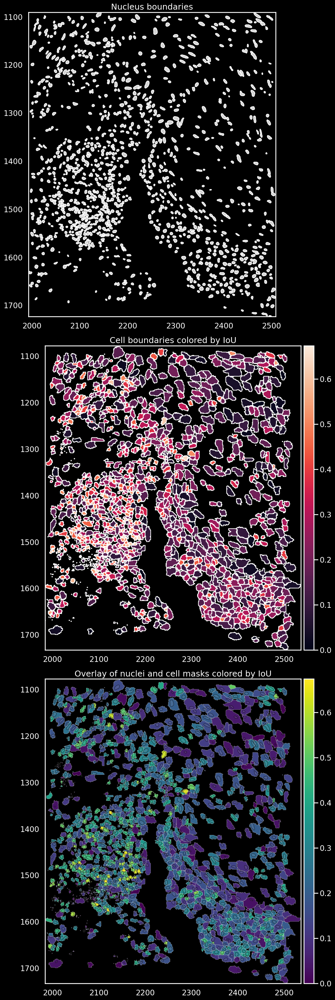

In [112]:
fig, axes = plot_ious(sdata_proseg_cropped, "cell_boundaries_z1")
fig.savefig(f"{output_dir}/iou_proseg_cropped.png", bbox_inches="tight", dpi=300)

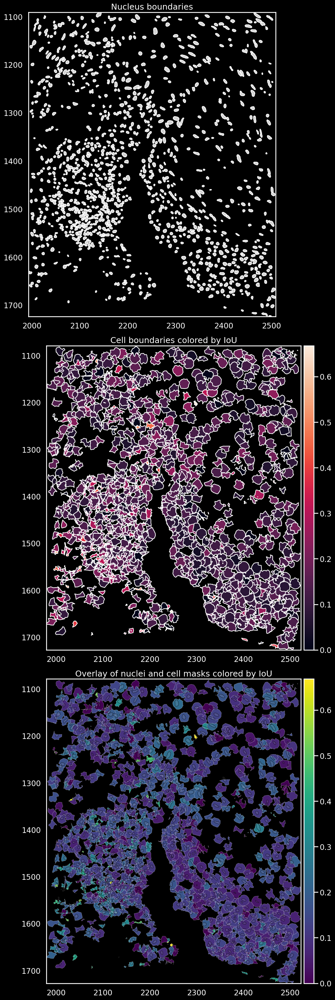

In [114]:
fig, axes = plot_ious(sdata_segger_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/iou_segger_cropped.png", bbox_inches="tight", dpi=300)

#### Label transfer

In [33]:
import anndata as ad

#scRNAseq_data_path = Path("/g/huber/projects/CODEX/segtraq/valid_testdata/BC_cellseg_10x/scRNAseq_reference/BC_scRNAseq_Janesick.h5ad")
scRNAseq_data_path = Path("/g/huber/projects/GSK_lazic/GSK_data_confidential/lung_copd/scRNAseq/scRNA_seq_subset.h5ad")
adata_ref = ad.read(scRNAseq_data_path)

In [34]:
for method, v in sdata_dict.items():
    #st.run_label_transfer(v["sdata"], adata_ref, celltype_key="original_ann_nonharmonized", inplace=True)
    st.run_label_transfer(v["sdata"], adata_ref, celltype_key="original_ann_nonharmonized", inplace=True)

In [35]:
# Define color palette and groups for plotting

col_celltype = {
    "ATI": "#ffffd1",
    "ATII": "#fed9a6",
    "Aberrant_Basaloid": "#fdb462",
    "Basal": "#1c92ff",
    "B": "#a880fa",
    "B_Plasma": "#00ffff",
    "Ciliated": "#bc80bd",
    "Club": "#beaed4",
    "DC_Langerhans": "#fddaec",
    "DC_Mature": "#fb9a99",
    "Fibroblast": "#f20389",
    "Goblet": "#fb8072",
    "ILC_A": "#fe8eaf",
    "ILC_B": "#f000f0",
    "Ionocyte": "#e31a1c",
    "Lymphatic": "#910290",
    "Macrophage": "#e6f5c9",
    "Macrophage_Alveolar": "#ccebc5",
    "Mast": "#ee7600",
    "Mesothelial": "#c6ff48",
    "Myofibroblast": "#41d039",
    "NK": "#3c7761",
    "PNEC": "#68b4ee",
    "Pericyte": "#80b1d3",
    "SMC": "#33b4b4",
    "T": "#66a61e",
    "T_Cytotoxic": "#959059",
    "T_Regulatory": "#d2cd7e",
    "VE_Arterial": "#1b9e77",
    "VE_Capillary_A": "#66c2a5",
    "VE_Capillary_B": "#2782bb",
    "VE_Peribronchial": "#a6cee3",
    "VE_Venous": "#d4f1f0",
    "cDC1": "#a9bdd2",
    "cDC2": "#d9d9d9",
    "cMonocyte": "#02008a",
    "ncMonocyte": "#717171",
    "pDC": "#d45943",
    "Unknown": "#808080",
}


# col_celltype = {
#     "T": "#fb8072",
#     "B": "#bc80bd",
#     "macro": "#910290",
#     "dendritic": "#fdb462",
#     "mast": "#959059",
#     "perivas": "#fed9a6",
#     "endo": "#a6cee3",
#     "myoepi": "#2782bb",
#     "DCIS1": "#3c7761",
#     "DCIS2": "#66a61e",
#     "tumor": "#66c2a5",
#     "stromal": "#d45943",
#     "Unknown": "#808080",
# }


In [36]:
def plot_transferred_labels(sdata, boundaries_key):
    # Replace NaN with Unknown
    s = sdata.tables["table"].obs["transferred_celltype"]
    if pd.api.types.is_categorical_dtype(s):
        s = s.cat.add_categories(["Unknown"])

    sdata.tables["table"].obs["transferred_celltype_plot"] = s.fillna("Unknown")
    labels = sdata.tables["table"].obs["transferred_celltype_plot"].unique().astype(str).tolist()
    cols = [col_celltype[lab] for lab in labels]

    # Dark background figure + axes
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), constrained_layout=True, facecolor="black")
    axes = axes.flatten()
    for ax in axes:
        ax.set_facecolor("black")
        ax.tick_params(colors="white")
        ax.title.set_color("white")

    # Dapi image
    sdata.pl.render_images("morphology_focus").pl.show(
        ax=axes[0],
        title="DAPI image",
        coordinate_systems="global"
    )

    # Cell boundaries with transferred labels
    sdata.tables["table"].obs["region"] = boundaries_key
    sdata.set_table_annotates_spatialelement("table", region=boundaries_key)

    sdata.pl.render_shapes(
        boundaries_key,
        color="transferred_celltype_plot",
        palette=cols,
        groups=labels,
        outline_color="white",   # outlines visible on black
        outline_width=0.5
    ).pl.show(
        ax=axes[1],
        title="10x Xenium: Cell mask - boundaries",
        coordinate_systems="global"
    )

    return fig, axes


In [37]:
sdata_xenium_cropped = crop(sdata_xenium, bb_xmin, bb_ymin, bb_xmax, bb_ymax)


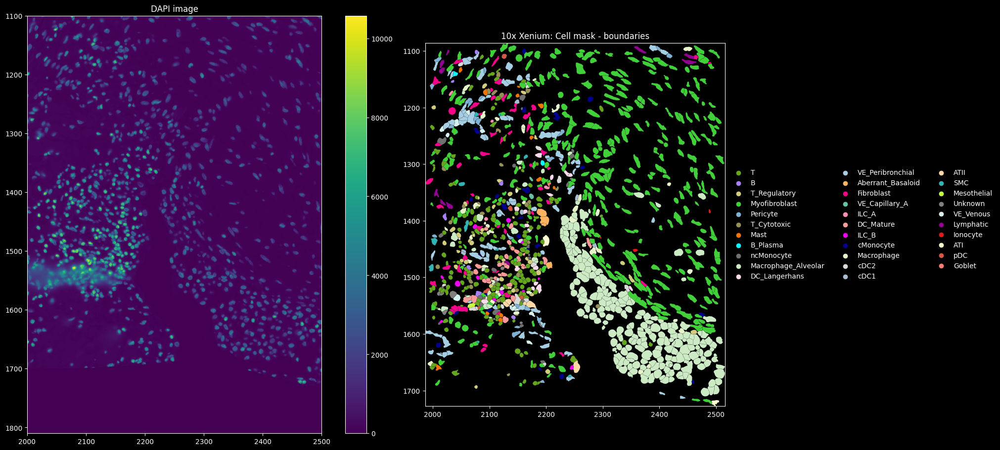

In [38]:
fig, axes = plot_transferred_labels(sdata_xenium_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/labels_xenium_cropped.png", bbox_inches="tight", dpi=300)

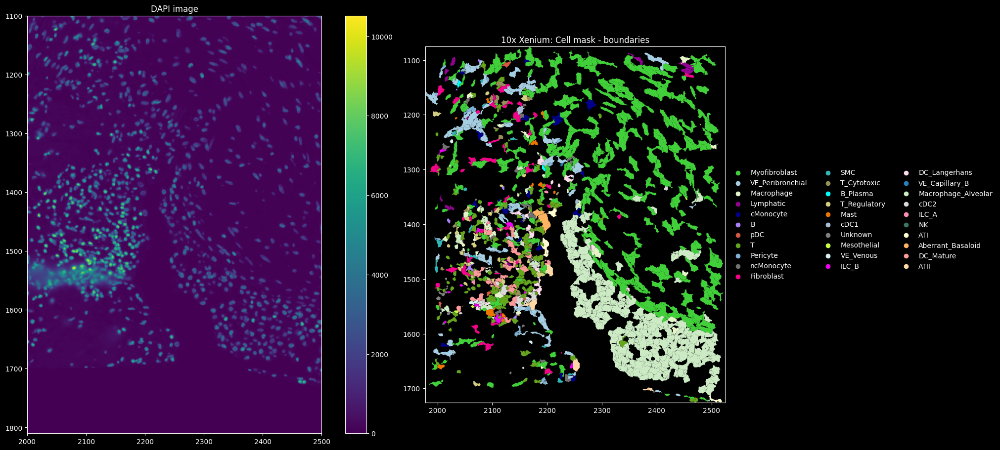

In [39]:
sdata_bidcell_cropped = crop(sdata_bidcell, bb_xmin, bb_ymin, bb_xmax, bb_ymax)
fig, axes = plot_transferred_labels(sdata_bidcell_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/labels_bidcell_cropped.png", bbox_inches="tight", dpi=300)

In [40]:
sdata_proseg["table"].obs["region"] = "cell_boundaries_z1"

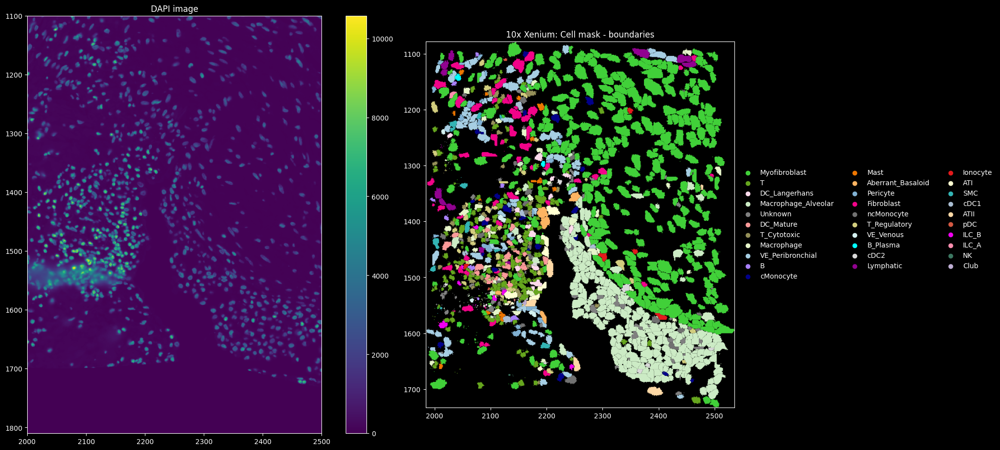

In [41]:
sdata_proseg_cropped = crop(sdata_proseg, bb_xmin, bb_ymin, bb_xmax, bb_ymax)
fig, axes = plot_transferred_labels(sdata_proseg_cropped, "cell_boundaries_z1")
fig.savefig(f"{output_dir}/labels_proseg_cropped.png", bbox_inches="tight", dpi=300)

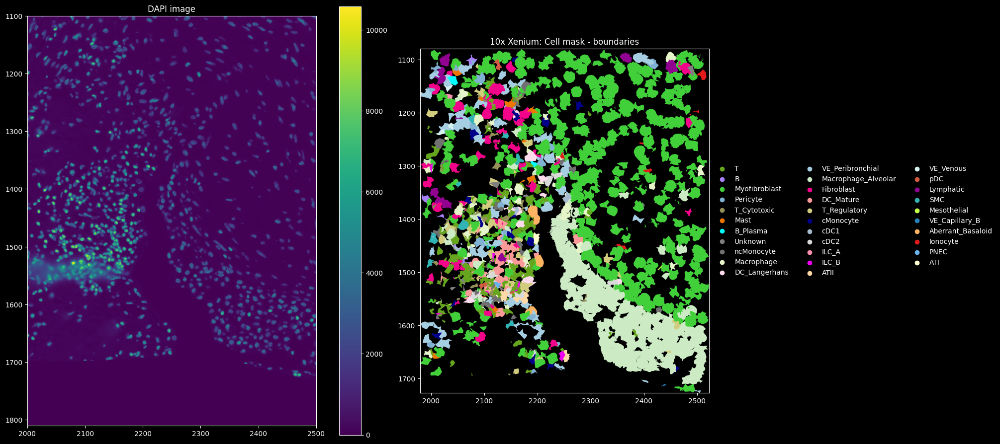

In [42]:
sdata_segger_cropped = crop(sdata_segger, bb_xmin, bb_ymin, bb_xmax, bb_ymax)
fig, axes = plot_transferred_labels(sdata_segger_cropped, "cell_boundaries")
fig.savefig(f"{output_dir}/labels_segger_cropped.png", bbox_inches="tight", dpi=300)

#### Save TIFF files of transcripts

In [57]:
from matplotlib.colors import to_rgb

for method, v in sdata_dict.items():

    obs = v["sdata"].tables["table"].obs

    label_to_ct = obs.set_index("label_id")["transferred_celltype"]

    max_id = obs["label_id"].max()

    mapped = label_to_ct.map(col_celltype)
    mapped = mapped.cat.add_categories(["#808080"])
    hex_series = mapped.fillna("#808080")

    lut = np.zeros((max_id + 1, 3), np.uint8)
    for lid, hexcol in hex_series.dropna().items():
        lut[int(lid)] = (np.array(to_rgb(hexcol)) * 255).astype(np.uint8)

    id_map = dict(zip(obs["cell_id"], obs["label_id"], strict=False))
    id_map.setdefault(v["ua_key"], 0)

    da = v["sdata"].labels[v["cell_lb"]]["scale0"]["image"]
    labels = da.to_numpy()
    H, W = labels.shape

    pts = v["sdata"].points["transcripts"]
    df = pts.compute() if hasattr(pts, "compute") else pts

    x = df["x"].astype(int).to_numpy()
    y = df["y"].astype(int).to_numpy()
    lid = df["cell_id"].map(id_map).astype(int).to_numpy()

    ok = (x >= 0) & (x < W) & (y >= 0) & (y < H) & (lid >= 0) & (lid <= max_id)

    img_rgb = np.zeros((H, W, 3), np.uint8)
    img_rgb[y[ok], x[ok]] = lut[lid[ok]]
    tiff.imwrite(output_dir / f"transcripts_{method}_transferred_celltype.tif", img_rgb, photometric="rgb")


In [87]:
plt.style.use("dark_background")
fig, axs = plt.subplots(1, 4, figsize=(27,8))

# Flatten axs in case of single row/column
axs = axs.flatten()

for i, (method, v) in enumerate(sdata_dict.items()):

    # here, we do not want to alter the original data, so we create a deep copy
    adata = v["sdata"].tables["table"]
    # sc.pp.pca(adata)
    # sc.pp.neighbors(adata)
    # sc.tl.umap(adata)

    sc.pl.umap(
        adata,
        color="transferred_celltype",
        palette = col_celltype,
        legend_loc="none",
        ax=axs[i],
        show=False,
        size=20,
        title=method,
    )

plt.tight_layout()
plt.savefig(f"{output_dir}/umaps_transferred.png", bbox_inches="tight", dpi=300)
plt.close()
plt.show()

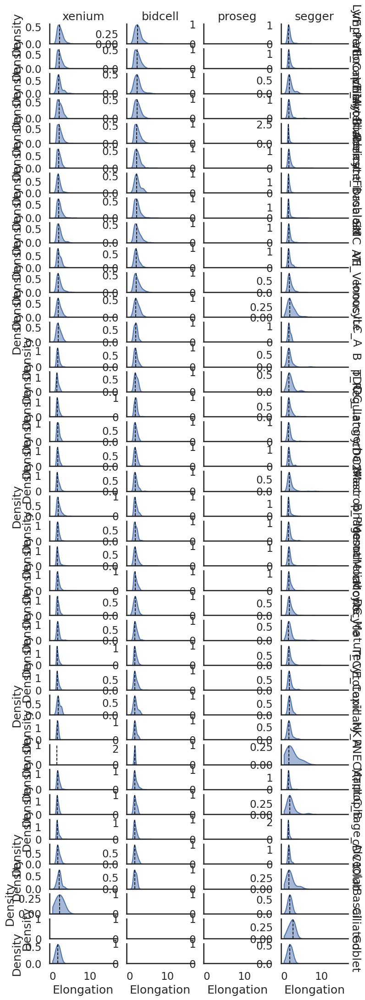

In [ ]:
dfs = []

for method, v in sdata_dict.items():
    df = v["sdata"]["table"].obs[["transferred_celltype", "elongation"]].copy()
    df["method"] = method
    dfs.append(df)

    data = pd.concat(dfs, ignore_index=True)
    
# 1) Order cell types by BidCell medians (descending)
bid_medians = (
    data.query("method == 'bidcell'")
        .groupby("transferred_celltype")["elongation"]
        .median()
        .sort_values(ascending=False)
)
row_order = bid_medians.index.tolist()

# 2) Fix categorical orders (rows by BidCell, columns by desired method order)
col_order = ["xenium", "bidcell", "proseg", "segger"]
data["transferred_celltype"] = pd.Categorical(data["transferred_celltype"], categories=row_order, ordered=True)
data["method"] = pd.Categorical(data["method"], categories=col_order, ordered=True)

# 3) Styling: no grids
sns.set_style("white")  # clean background, no grid
sns.set_context("talk", rc={"axes.grid": False})

# 4) Facet: rows = cell types, cols = methods
#    With ~38 rows, keep each facet short; make it wide enough to read.
height_per_row = 0.7   # ~0.6–0.8 works well for tall grids
aspect = 3.0           # wider panels so the KDE shape is readable

g = sns.FacetGrid(
    data,
    row="transferred_celltype",
    col="method",
    row_order=row_order,
    col_order=col_order,
    sharex=True,
    sharey=False,
    height=height_per_row,
    aspect=aspect,
    margin_titles=True,
    despine=True
)

# 5) Smoothed histogram (density). Increase bw_adjust for extra smoothing if needed.
g.map_dataframe(sns.kdeplot, x="elongation", fill=True, alpha=0.5, bw_adjust=1.2, clip=(0, None))

# 6) Add median lines per facet
for i, ct in enumerate(row_order):
    for j, m in enumerate(col_order):
        ax = g.axes[i, j]
        subset = data[(data["transferred_celltype"] == ct) & (data["method"] == m)]
        if not subset.empty:
            med = subset["elongation"].median()
            ax.axvline(med, linestyle="--", linewidth=1.2, color="black")
        # remove grids explicitly (paranoid)
        ax.grid(False)

# 7) Labels, titles, spacing
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_axis_labels("Elongation", "Density")

# Tighten spacing a bit for tall figure
g.fig.subplots_adjust(hspace=0.25, wspace=0.15)

plt.show()


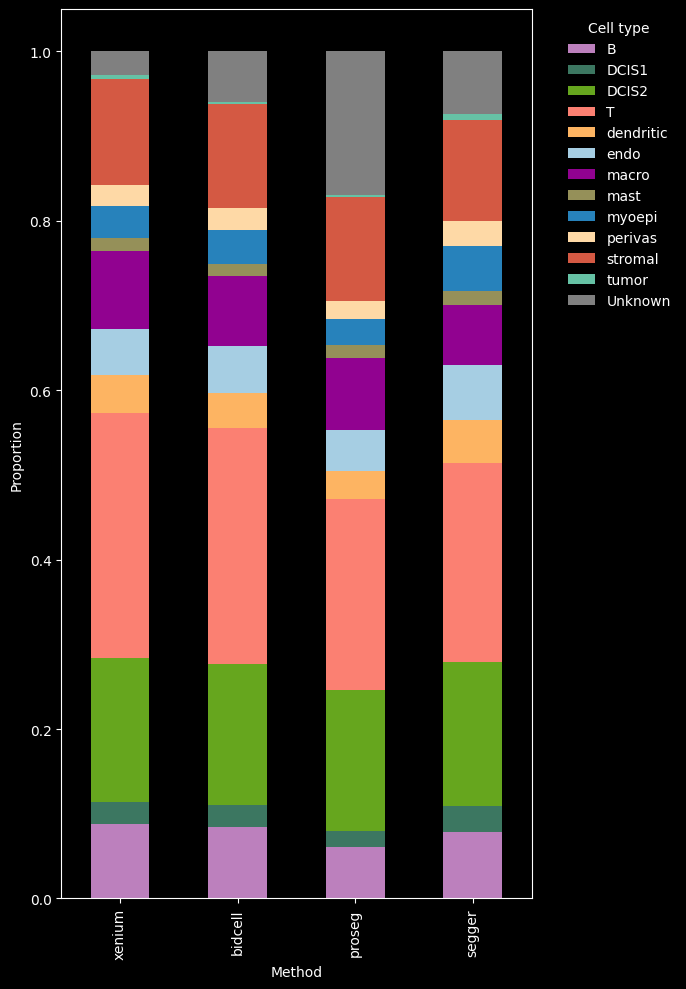

<Figure size 640x480 with 0 Axes>

In [98]:
method_dfs = []
for method, v in sdata_dict.items():
    df = v["sdata"]["table"].obs["transferred_celltype_plot"].value_counts(normalize=True).reset_index()
    df.columns = ["celltype", "proportion"]
    df["method"] = method
    method_dfs.append(df)

plot_df = pd.concat(method_dfs, ignore_index=True)
plot_wide = plot_df.pivot(index="method", columns="celltype", values="proportion").fillna(0)

method_order = ["xenium", "bidcell", "proseg", "segger"]
plot_wide = plot_wide.loc[method_order]

# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(7,10), facecolor="black")
ax.set_facecolor("black")

# Plot stacked bars
plot_wide.plot(
    kind="bar",
    stacked=True,
    color=[col_celltype.get(c, "grey") for c in plot_wide.columns],
    ax=ax
)

# Axis labels and ticks in white
ax.set_ylabel("Proportion", color="white")
ax.set_xlabel("Method", color="white")
ax.tick_params(colors="white")

# Legend text in white
legend = ax.legend(title="Cell type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()
plt.savefig(f"{output_dir}/barplot.png", bbox_inches="tight", dpi=300)


In [99]:
for method, v in sdata_dict.items():
    tc = st.bl.transcripts_per_cell(v["sdata"])
    v["sdata"]["table"].obs = v["sdata"]["table"].obs.merge(
        tc,
        how="left",
        left_on="cell_id",
        right_on="cell_id"
    )

In [107]:
def boxplot_per_celltype(sdata_dict, feature, q=1):
    dfs = []
    for method, v in sdata_dict.items():
        obs = v["sdata"]["table"].obs
        tmp = obs[["transferred_celltype", feature]].copy()
        tmp["method"] = method
        dfs.append(tmp)

    df = pd.concat(dfs, ignore_index=True)
    #df = df[~df[feature].isna()]
    df = df[(df[feature] <= df[feature].quantile(q))]

    # Dark background
    plt.style.use("dark_background")

    fig, ax = plt.subplots(figsize=(19, 6), facecolor="black")
    ax.set_facecolor("black")

    # Boxplot
    sns.boxplot(
        data=df,
        x="transferred_celltype",
        y=feature,
        hue="method",
        showcaps=True,
        showfliers=False,
        palette="Set2",
        ax=ax
    )

    # # Stripplot on top
    # sns.stripplot(
    #     data=df,
    #     x="transferred_celltype",
    #     y=feature,
    #     hue="method",
    #     dodge=True,
    #     jitter=0.2,
    #     palette="Set2",
    #     alpha=0.4,
    #     size=2,
    #     ax=ax
    # )

    # Fix duplicate legends
    handles, labels = ax.get_legend_handles_labels()
    n_methods = df["method"].nunique()
    legend = ax.legend(
        handles[:n_methods],
        labels[:n_methods],
        title="Method",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        frameon=False
    )

    # White legend text
    plt.setp(legend.get_texts(), color="white")
    plt.setp(legend.get_title(), color="white")

    # Axis styling
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")
    ax.set_xlabel("Cell type", color="white")
    ax.set_ylabel(feature, color="white")
    ax.tick_params(colors="white")

    fig.tight_layout()
    plt.savefig(f"{output_dir}/boxplot_{feature}.png", bbox_inches="tight", dpi=300)
    plt.show()


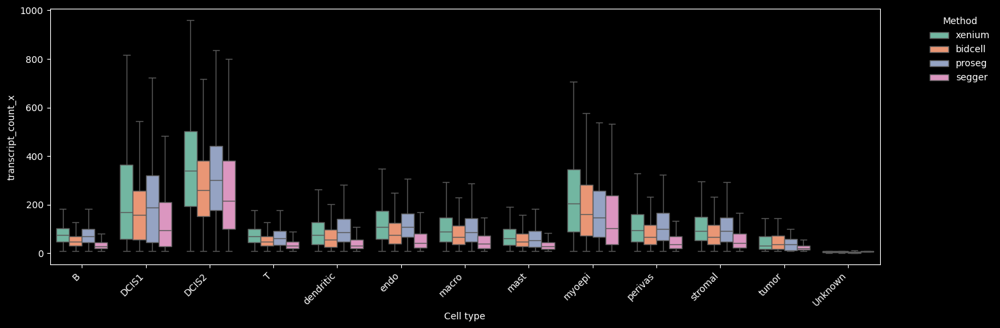

In [101]:
boxplot_per_celltype(sdata_dict, "transcript_count_x")

#### Supervised spillover metrics

In [119]:
for method, v in sdata_dict.items():
    tbl = v["sdata"]["table"]
    common_genes = tbl.var_names[tbl.var_names.isin(adata_ref.var_names)]
    adata_ref = adata_ref[:, common_genes].copy()

    markers = st.sp.get_ref_markers(adata_ref, cell_type_column="original_ann_nonharmonized", q_pos=0.95, q_neg=0.1, t=0.25)
    purity_df = st.sp.calculate_marker_purity(v["sdata"], celltype_column="transferred_celltype", markers=markers)

    tbl.obs = tbl.obs.merge(
        purity_df.reset_index(),
        how="left",
        left_on="cell_id",
        right_on="cell_id",
    )

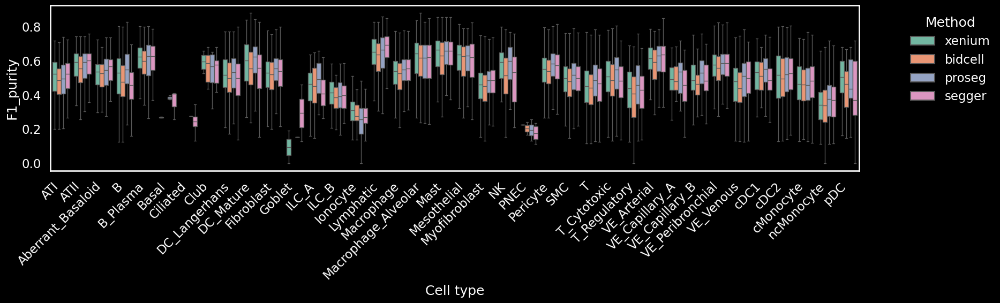

In [120]:
boxplot_per_celltype(sdata_dict, "F1_purity")

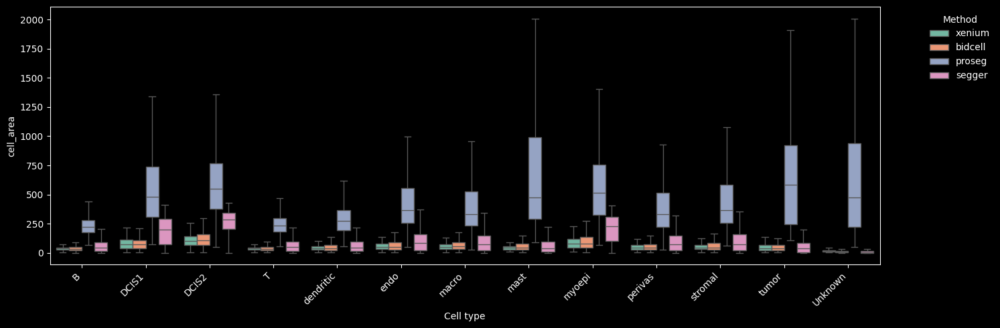

In [105]:
boxplot_per_celltype(sdata_dict, "cell_area", q=0.99)


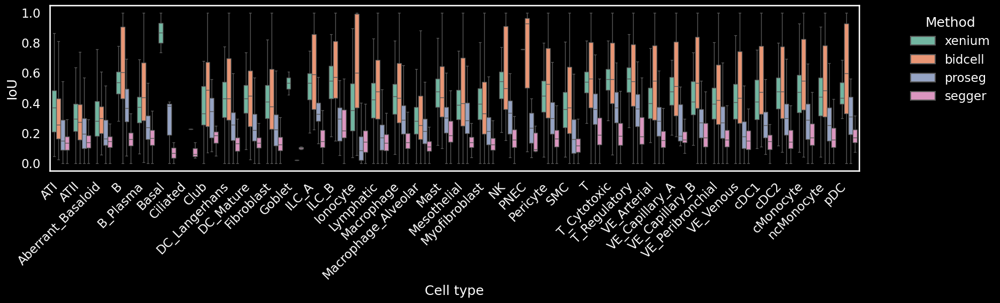

In [108]:
boxplot_per_celltype(sdata_dict, "IoU")

In [128]:
dfs = []
for method, v in sdata_dict.items():
    
    obs = v["sdata"].tables["table"].obs

    df = obs[["F1_purity", "IoU"]].copy()
    df = df.mean().to_frame().T
    df["method"] = method
    dfs.append(df)

plot_df = pd.concat(dfs, ignore_index=True)

# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(8, 4), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=plot_df,
    x="IoU",
    y="F1_purity",
    hue="method",
    style="method",
    s=200,
    palette="Set2",    # consistent method palette
    ax=ax
)

ax.set_xlabel("IoU (↑)", color="white")
ax.set_ylabel("F1 purity (↑)", color="white")
ax.set_title("IoU vs. F1 purity", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
fig.savefig(f"{output_dir}/IoUvsF1.png", bbox_inches="tight", dpi=300)
plt.close()
plt.show()


In [129]:
results_df

,Method,MCD,Silhouette Score,Purity,ARI
0,xenium,0.267244,0.183613,0.621142,0.407076
1,bidcell,0.297760,0.138910,0.615309,0.394565
2,proseg,0.215468,0.221089,0.632481,0.415749
3,segger,0.272592,0.188044,0.648323,0.453923


In [133]:
sdata_segger["table"].obs["F1_purity"].mean()

np.float64(0.4970700608532178)